### After we have generated embeddings from training using resnet we will generate 20 similar faces for 10 queris from LFW dataset. This notebook will generte the embedding for these queries and show the output using baseline performance.

### Note: Preprocessing-Queries.ipynb file must be run before this to get the Targeted faces using MTCNN.

### If you want to skip the preprocessing stage 'query_images.npy' can be downloaded here: https://drive.google.com/drive/folders/1xv_nYTJh9bp8PoEHL4tUhz1uUttaJIzt?usp=sharing

### Training embeddings for ResNet can be downloaded here: https://drive.google.com/drive/folders/1CtLdASAT8FpboPUgcW-PXiFcO2hxKA5U?usp=sharing, they must be stored under the ResNet Folder

# Load Query Images

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
X = np.load('query_images.npy') # query_images from preprocessing step

# Resnet 50

In [3]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input

In [4]:
resnet_model = ResNet50(weights='imagenet', input_shape=(250, 250, 3), include_top=False, pooling='avg')

In [5]:
for layer in resnet_model.layers[:]:
    layer.trainable = False

In [6]:
resnet_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 125, 125, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 63, 63, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 63, 63, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 63, 63, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 63, 63, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [7]:
X_processed = preprocess_input(X)

In [8]:
X_features = list()

count = 1
for train in X_processed:
  # print(train[None, :, :, :].shape)
  X_features.append(resnet_model.predict(train[None, :, :, :])[0])
  print(f'Predicted: {count}')
  count += 1

X_features = np.array(X_features)

Predicted: 1
Predicted: 2
Predicted: 3
Predicted: 4
Predicted: 5
Predicted: 6
Predicted: 7
Predicted: 8
Predicted: 9
Predicted: 10


In [9]:
X_features.shape

(10, 2048)

In [10]:
# np.savetxt(os.path.join("ResNet-queries", "X_features.txt"), X_features)

In [11]:
X_features = np.loadtxt(os.path.join("ResNet-queries",'X_features.txt'))

# KNN

In [12]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [13]:
X_test_features = np.loadtxt('0001/X_test_features.txt')
X_train_features = np.loadtxt('0001/X_train_features.txt')

In [14]:
y_train = pd.read_csv('0001/train.csv')
y_test = pd.read_csv('0001/test.csv')

In [15]:
y = np.concatenate([np.array(y_train.Name), np.array(y_test.Name)], axis=0)
X = np.concatenate([X_train_features, X_test_features], axis=0)

In [16]:
neigh = KNeighborsClassifier(n_neighbors=20)

In [17]:
neigh.fit(X, y)

KNeighborsClassifier(n_neighbors=20)

In [18]:
dist, index = neigh.kneighbors(X_features)

# Output

### Here you can see the output of Baseline model for 10 query images. This can also be viewed here: https://drive.google.com/drive/folders/1lei2xt0TTgpJPy7agudtLli5m1QcvWJP?usp=sharing

In [19]:
def query_given(current_query):
    query_img = mpimg.imread('inputs/' + current_query)
    plt.imshow(query_img)
    plt.title(current_query)
    
#     os.mkdir('output/Baseline/' + current_query)
#     os.mkdir('output/Baseline/' + current_query + '/' + 'query')
#     plt.savefig('output/Baseline/' + current_query + '/' + 'query/' + current_query + '.jpg')
    

In [20]:
def query_results(top_results, current_query):
    
    fig, axs = plt.subplots(5, 4, figsize=(15,15))
    axis = axs.ravel()
    axis_index = 0
    
    for value in top_results:
        
        name = value[:-9]
        
        output_image = mpimg.imread('LFW' + '/' + name + '/' + value)
        
        axis[axis_index].imshow(output_image)
        axis[axis_index].set_title(value)
        
        axis_index += 1
        plt.tight_layout()
        
#     fig.savefig('output/Baseline/' + current_query + '/' + 'output.jpg')

In [21]:
query = ['Albert_Costa_0001.jpg',
 'Angela_Bassett_0001.jpg',
 'Arminio_Fraga_0001.jpg',
 'Billy_Crystal_0001.jpg',
 'Bob_Graham_0001.jpg',
 'Boris_Becker_0001.jpg',
 'Bulent_Ecevit_0001.jpg',
 'Calista_Flockhart_0001.jpg',
 'Cameron_Diaz_0001.jpg',
 'Carmen_Electra_0001.jpg']

# Images

## Albert_Costa

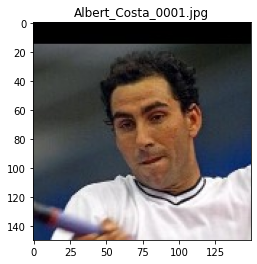

In [22]:
query_given(query[0])

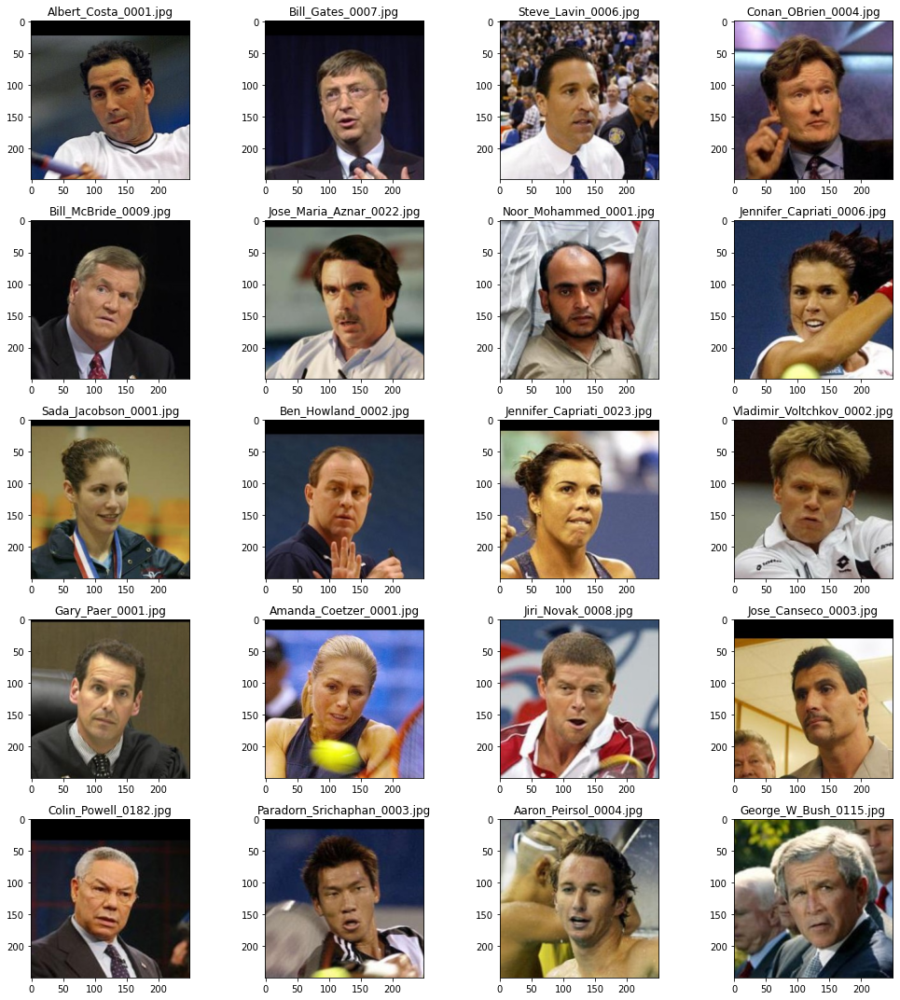

In [23]:
query_results(y[index][0], query[0])

## Angela Bassett

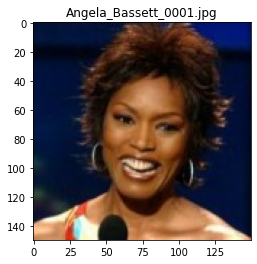

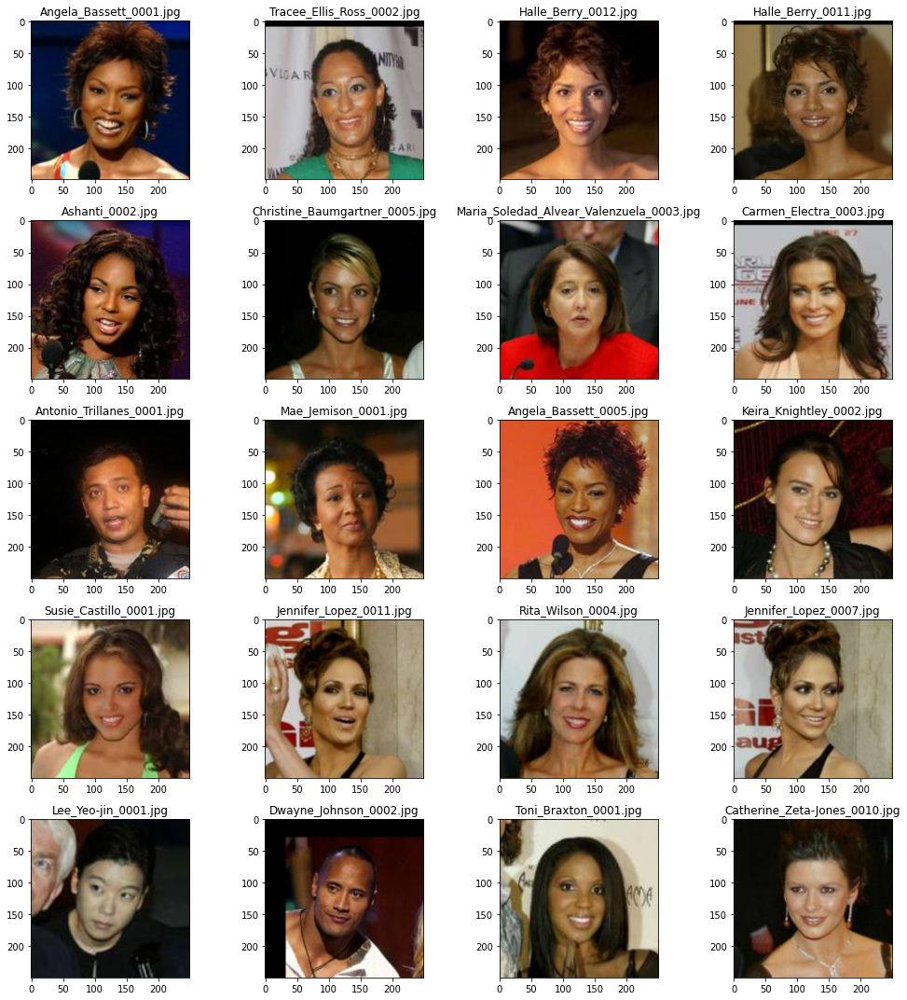

In [24]:
query_given(query[1])
query_results(y[index][1], query[1])

## Arminio Fraga

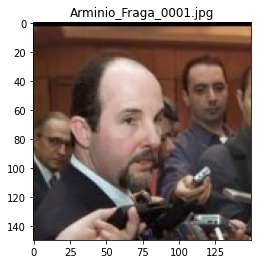

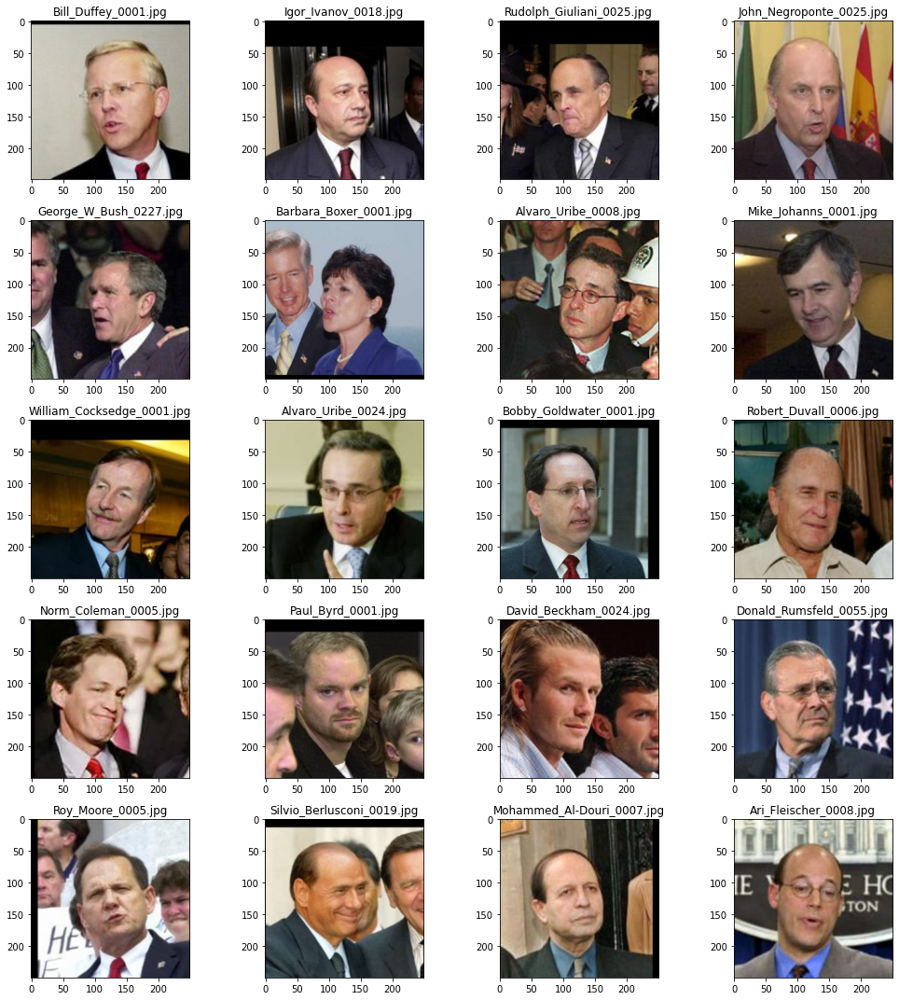

In [25]:
query_given(query[2])
query_results(y[index][2], query[2])

## Billy Crystal

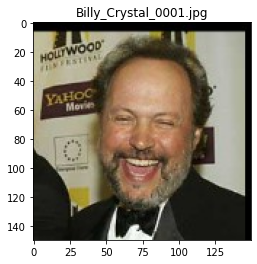

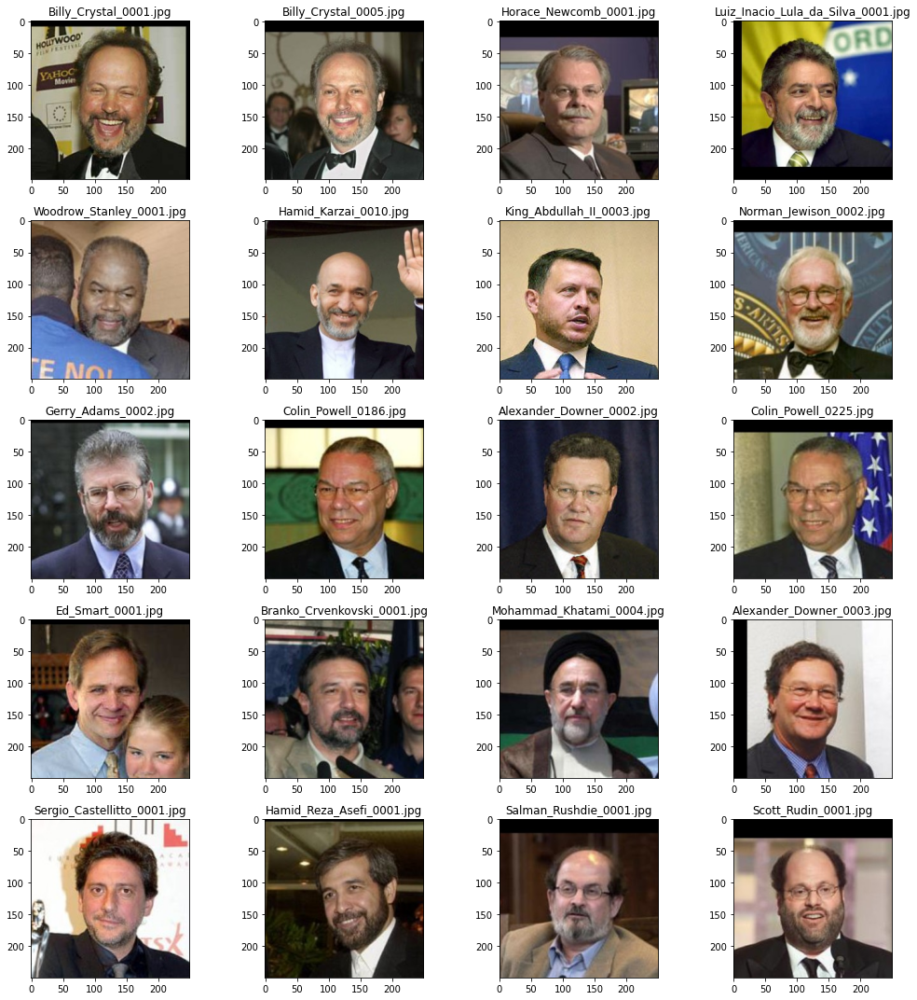

In [26]:
query_given(query[3])
query_results(y[index][3], query[3])

## Bob Graham

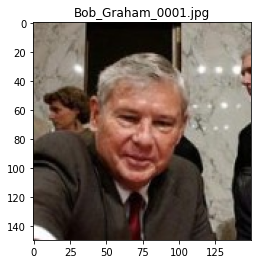

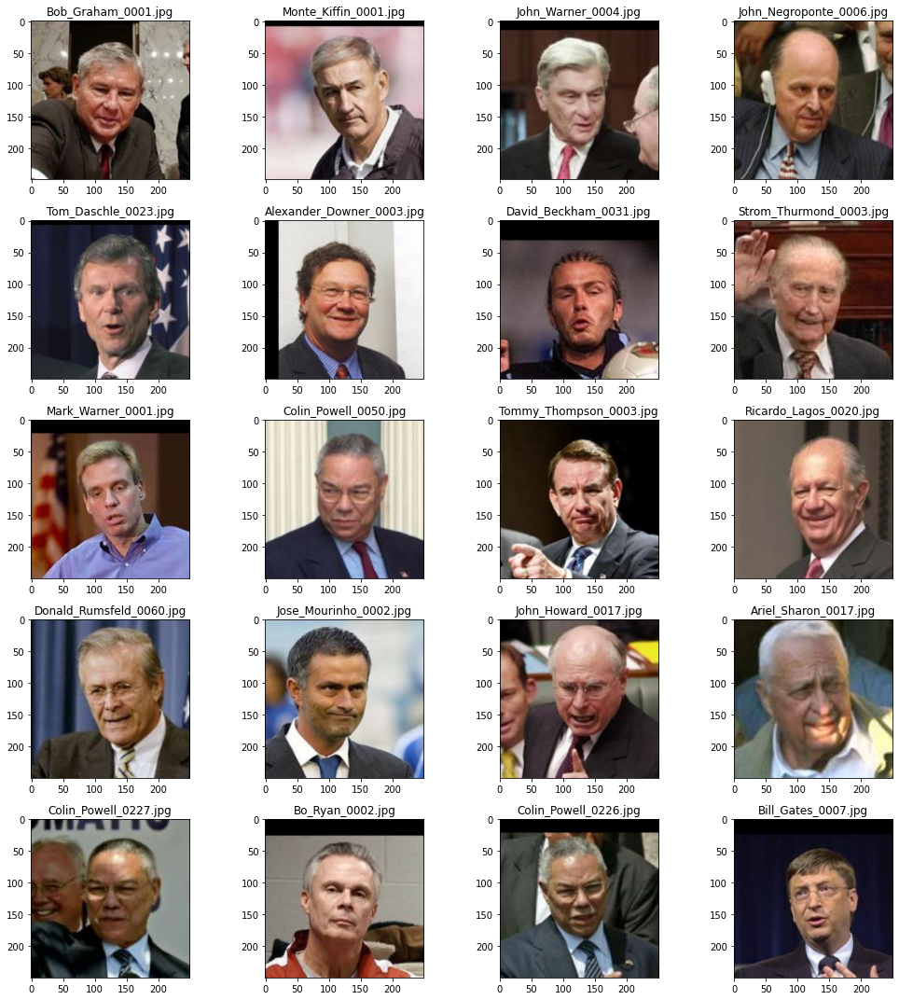

In [27]:
query_given(query[4])
query_results(y[index][4], query[4])

## Boris Becker

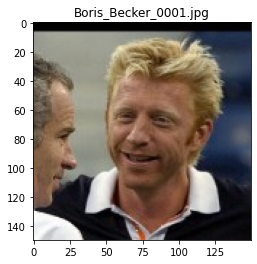

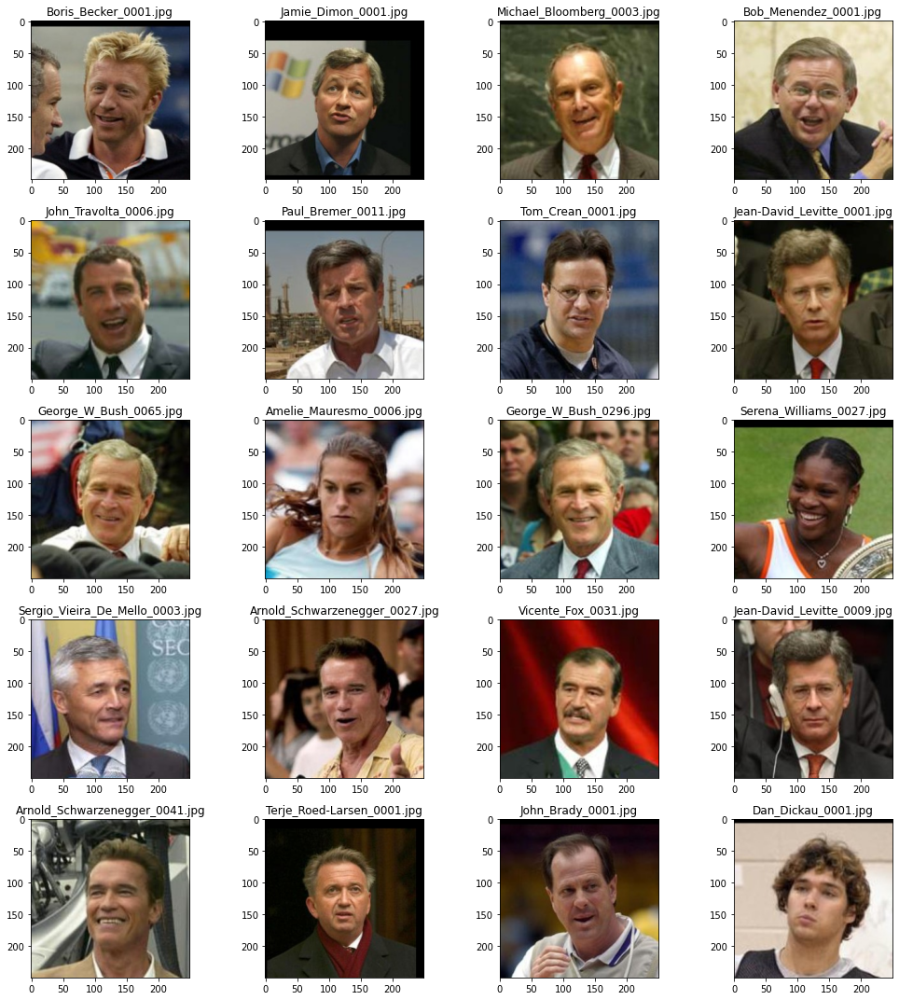

In [28]:
query_given(query[5])
query_results(y[index][5], query[5])

## Bulent Ecevit

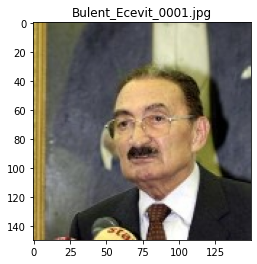

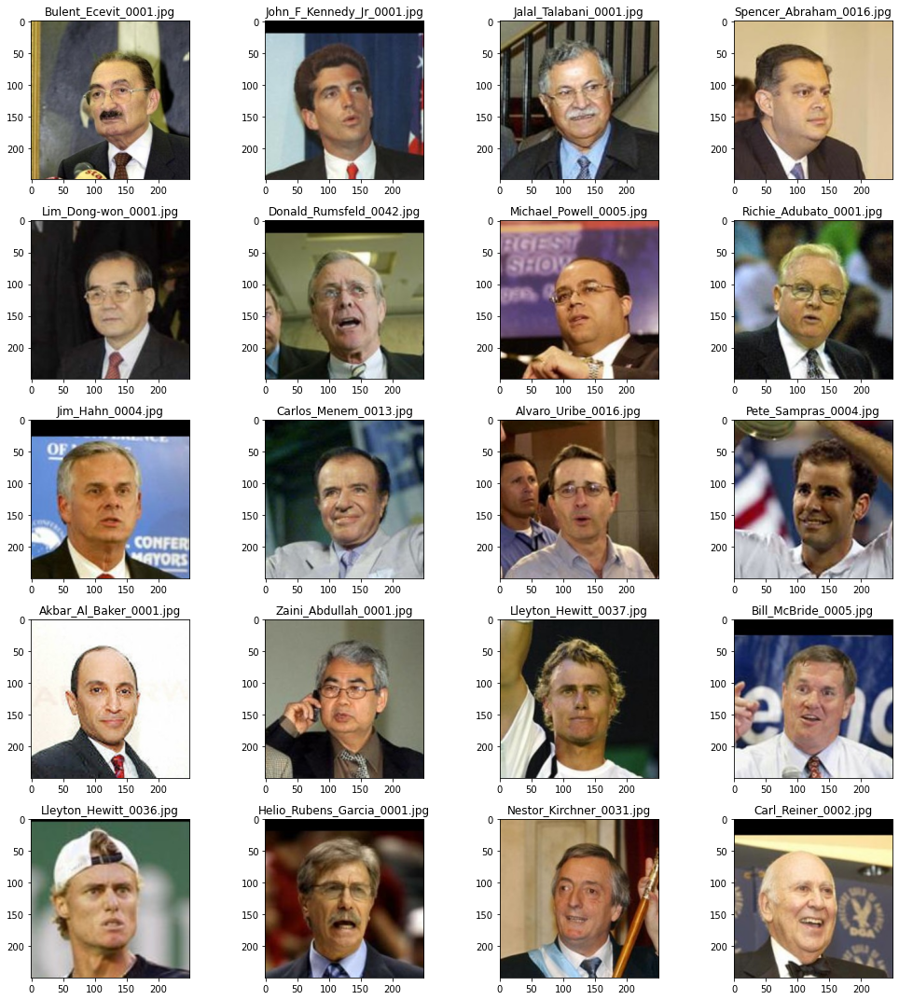

In [29]:
query_given(query[6])
query_results(y[index][6], query[6])

## Clista Flockhart

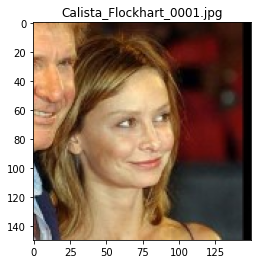

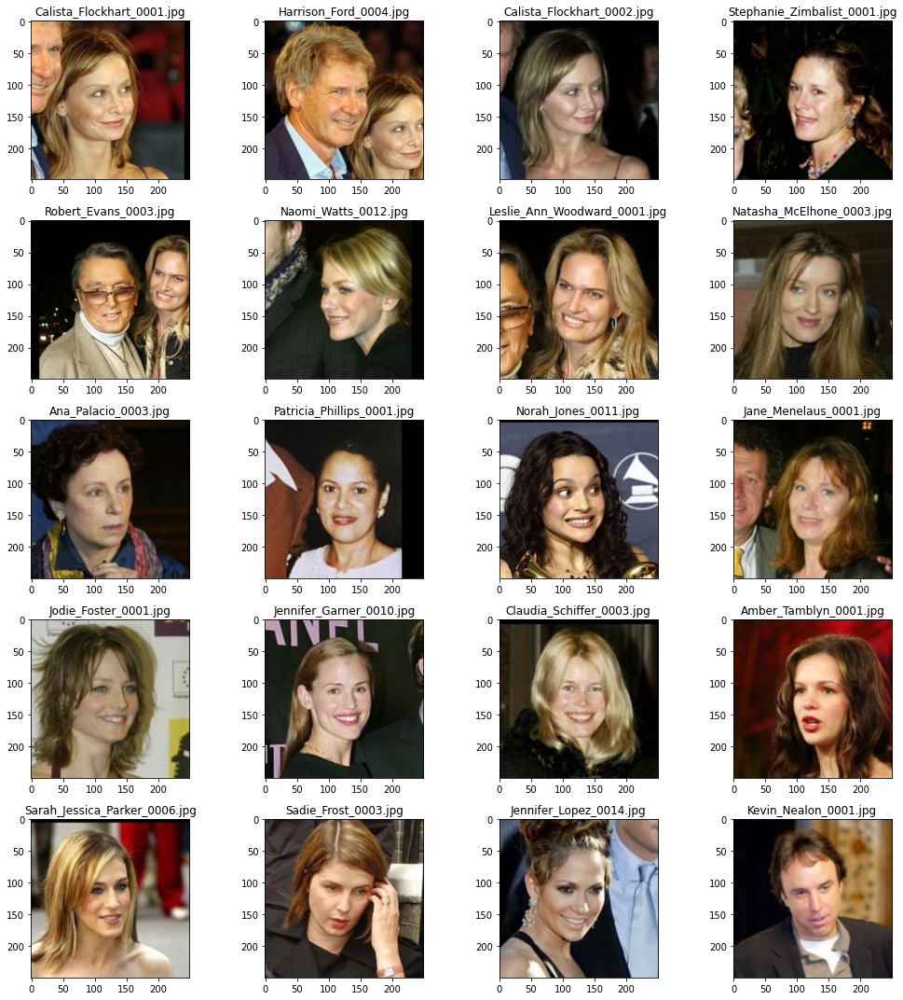

In [30]:
query_given(query[7])
query_results(y[index][7], query[7])

## Cameron Diaz

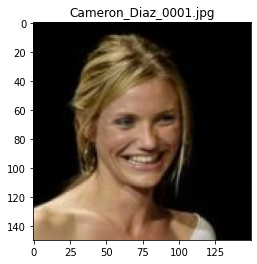

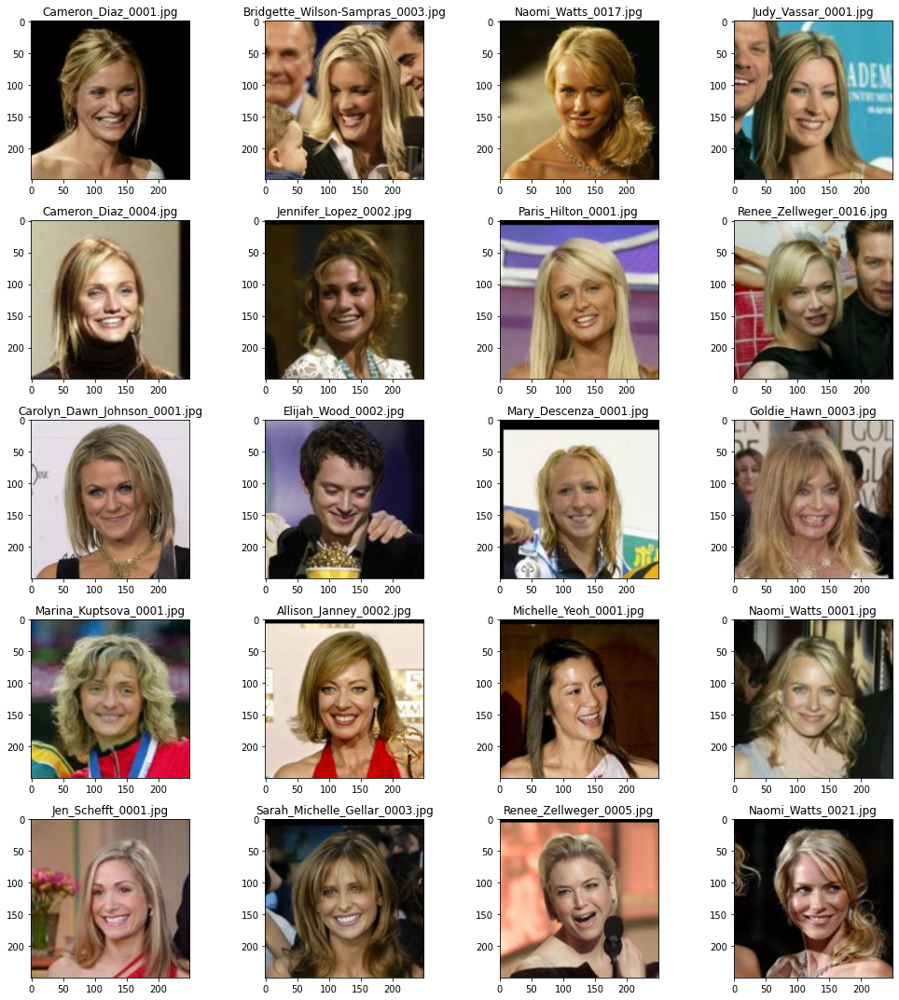

In [31]:
query_given(query[8])
query_results(y[index][8], query[8])

## Carmen Electra

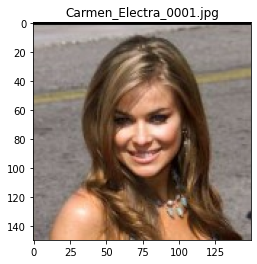

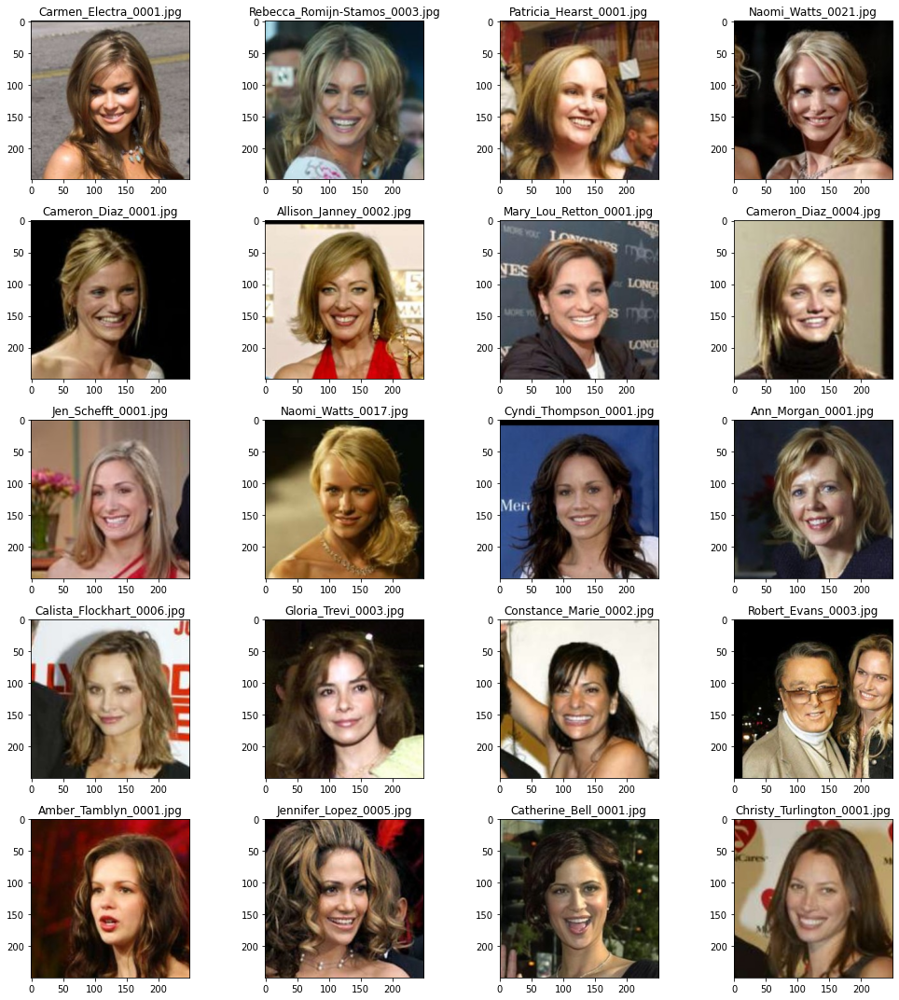

In [32]:
query_given(query[9])
query_results(y[index][9], query[9])